In [1]:
import numpy as np
from random import choice
import matplotlib.pyplot as plt

In [2]:
N = 4   # Number of states in the Markov process
T = transition_matrix = np.array([
    [1/2, 1/12, 1/6, 1/4],
    [1/3, 0, 1/3, 1/3],
    [1/3, 1/6, 1/6, 1/3],
    [1/3, 1/9, 2/9, 1/3]
]).T
assert len(T) == N

In [3]:
assert np.linalg.det(T) <= 1, "det needs < 1 to converte to stationary"

# Stationary Distribution $P(\theta)$

At the stationary equilibrium of the Markov chain, $T \cdot P(\theta) = P(\theta)$. Hennce $P(\theta)$ is the eigen vector of $T$ whose eigen value is equal or close to 1.

In [4]:
def get_stationary_distribution(transition_matrix):
    evals, evecs = np.linalg.eig(transition_matrix)

    # Find the eigen vector whose eigen value is close to 1
    evec = evecs[:,np.isclose(evals, 1)]

    # Since np.isclose will return an array, we've indexed with an array
    # so we still have our 2nd axis.  Get rid of it, since it's only size 1.
    evec = evec[:,0]
    stationary = evec / evec.sum()

    #eigs finds complex eigenvalues and eigenvectors, so you'll want the real part.
    stationary = stationary.real
    return stationary

In [5]:
P = get_stationary_distribution(T)
P

array([0.4, 0.1, 0.2, 0.3])

## Verify $T \cdot P(\theta) = P(\theta)$

In [6]:
T @ P

array([0.4, 0.1, 0.2, 0.3])

In [7]:
np.linalg.matrix_power(T, 1000) @ np.array([0.1, 0.2, 0.3, 0.4])

array([0.4, 0.1, 0.2, 0.3])

# Sample $P(\theta)$ by MCMC

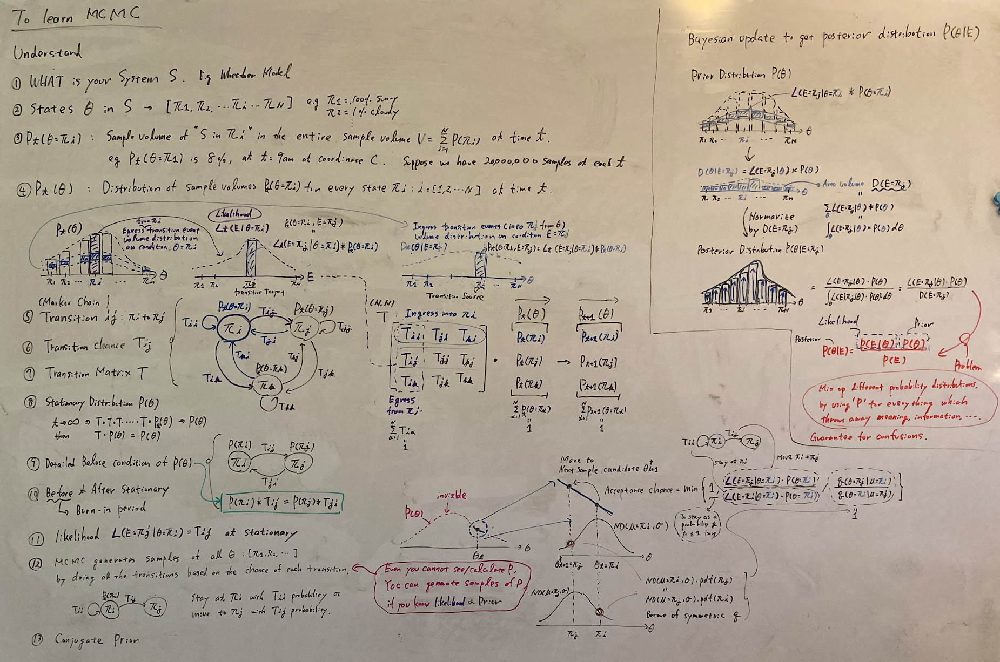

In [8]:
def get_transitions_from_state(transition_matrix, state_index):
    """Transition probabililities from state i
    Args:
        transition_matrix: column order matrix where each column at i-1 is transition probabilities of state i
        state_index: index to identify a state. State indices are 1,2,...N where number of the states is N.
    """
    return T.T[state_index-1]

In [9]:
def propose_next_state(current_state_incex, n=N):
    """Propose the next state to move to
    Returns: index of next state candidate
    """
    states_except_current = set(list(range(1, N+1))) - set([current_state_incex])
    return np.random.choice(list(states_except_current))
    # return np.random.randint(1, n+1)

In [10]:
def accept_or_reject_next_state(current_state_index, next_state_index, transition_matrix=T) -> bool:
    """Accept or reject the proposal of moving to the next state
    Note:
        Acceptance only depends on the transition probability.
    
    Args: 
        current_state_index: index of the current state in the Markov process
        next_state_index: proposed state to move to

    Returns: True if accept, else Flase
    """
    transition_probabilities_from_current_state = get_transitions_from_state(
        transition_matrix=transition_matrix, state_index=current_state_index
    )
    transition_probability_to_next_state = transition_probabilities_from_current_state[next_state_index-1]
    return transition_probability_to_next_state > np.random.random()

In [13]:
def mcmc(number_of_states=N, iterations=100000):
    current_state_index = 1
    number_of_samples = [0] * N
    acceptance = 0
    
    # number_of_samples[current_state_index-1] += 1
    for i in range(iterations):
        # Propose the next state to move to excluding the current state
        next_state_index = propose_next_state(current_state_incex=current_state_index)
        if accept_or_reject_next_state(current_state_index=current_state_index, next_state_index=next_state_index):
            # Move to the different state
            number_of_samples[next_state_index-1] += 1
            current_state_index = next_state_index
            acceptance += 1
        else:
            # Stay at current state
            number_of_samples[current_state_index-1] += 1
                    
    acceptrance_ratio = acceptance / iterations
    
    return number_of_samples / np.sum(number_of_samples), acceptrance_ratio

In [14]:
p, acceptance = mcmc()
print(f"stationary distibution {p}, acceptrance ratio {acceptance}")

stationary distibution [0.39914 0.10067 0.19728 0.30291], acceptrance ratio 0.22243


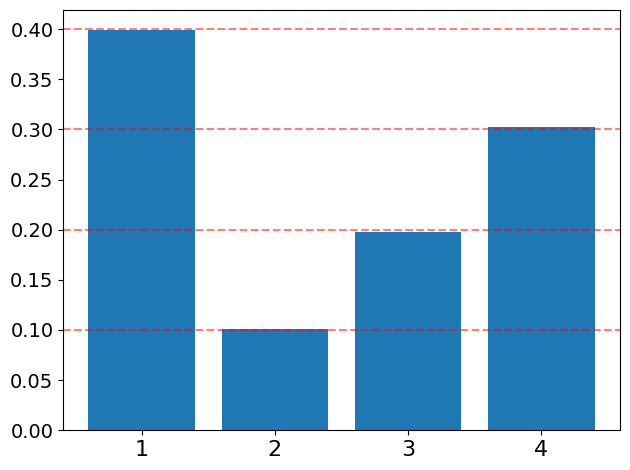

In [15]:
plt.bar(['1','2','3','4'], p)
plt.xticks(['1','2','3','4'], fontsize=16)
plt.yticks(np.arange(0,.45,.05), fontsize=14)
plt.axhline(.4, color='r', linestyle='--', alpha=0.5)
plt.axhline(.1, color='r', linestyle='--', alpha=0.5)
plt.axhline(.2, color='r', linestyle='--', alpha=0.5)
plt.axhline(.3, color='r', linestyle='--', alpha=0.5)
plt.tight_layout()